# <p><center style="font-family:newtimeroman;font-size:180%;">Alzheimers Dataset 4 Class ADNI Detection and Quality Evaluation Using Image Analysis </center></p>
### Table of contents:

* [Import Libraries](#1)
* [Read Data](#2)
* [Visualization Of Dataset](#3)
* [Data Augmentation](#4)
* [MobileNetV2 Model](#10)
* [Evaluate The Model](#11)


**<a id="1"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Import Libraries </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [1]:
import os 
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.image import ImageDataGenerator
import keras 
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm
from imblearn.over_sampling import SMOTE

2024-02-07 18:08:34.876066: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-07 18:08:34.876167: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-07 18:08:35.156533: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


**<a id="2"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Read Data </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [2]:
images = []
labels = []
for subfolder in tqdm(os.listdir('/kaggle/input/fdata-adni-dataset')):
    subfolder_path = os.path.join('/kaggle/input/fdata-adni-dataset', subfolder)
    for folder in os.listdir(subfolder_path):
        subfolder_path2=os.path.join(subfolder_path,folder)
        for image_filename in os.listdir(subfolder_path2):
            image_path = os.path.join(subfolder_path2, image_filename)
            images.append(image_path)
            labels.append(folder)
df = pd.DataFrame({'image': images, 'label': labels})
df

100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


,image,label
0,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,LMCI
1,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,LMCI
2,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,LMCI
3,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,LMCI
4,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,LMCI
...,...,...
33979,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,CN
33980,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,CN
33981,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,CN
33982,/kaggle/input/fdata-adni-dataset/AugmentedAlzh...,CN


**<a id="3"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Visualization of Dataset </p>
<a class="btn" href="#home">Tabel of Contents</a>

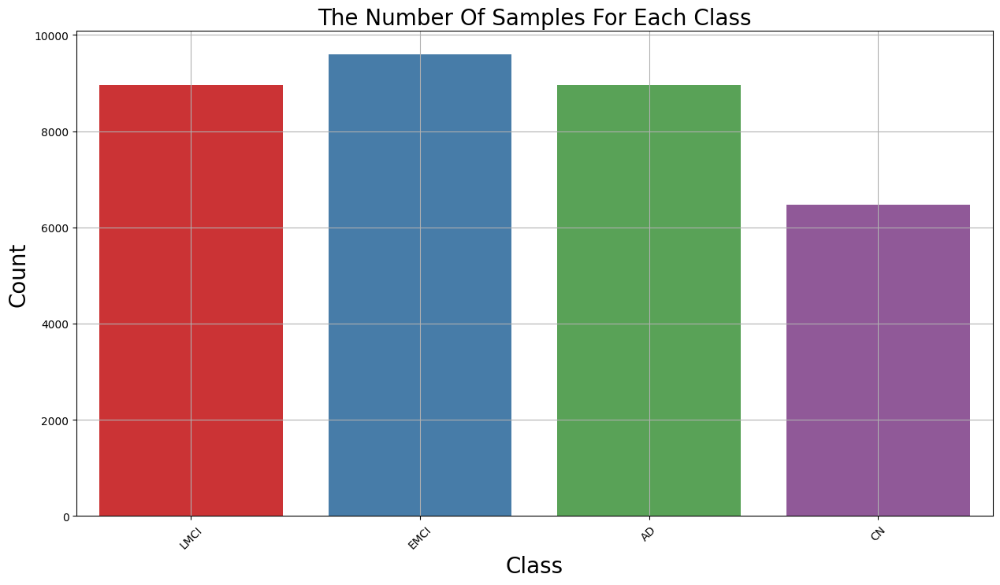

In [3]:
plt.figure(figsize=(15,8))
ax = sns.countplot(x=df.label,palette='Set1')
ax.set_xlabel("Class",fontsize=20)
ax.set_ylabel("Count",fontsize=20)
plt.title('The Number Of Samples For Each Class',fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

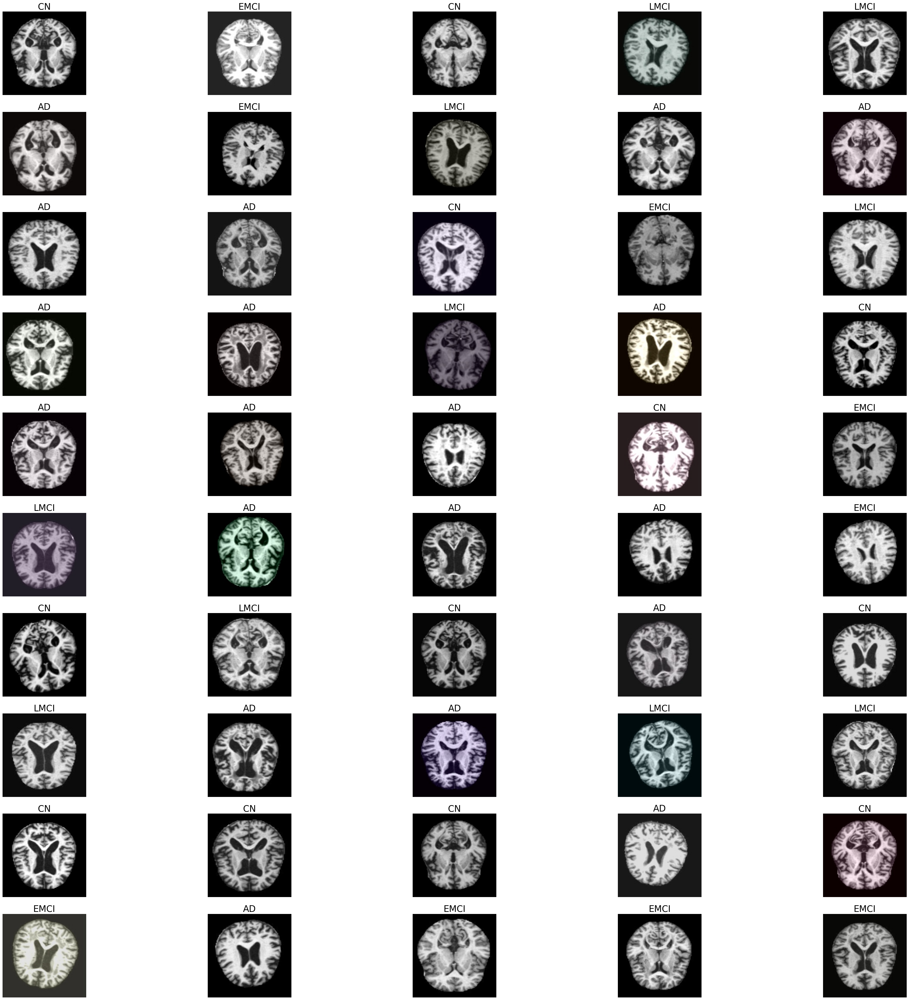

In [4]:
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(df),50)):
    plt.subplot(10,5,n+1)
    img=cv2.imread(df.image[i])
    img=cv2.resize(img,(224,224))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
    plt.title(df.label[i],fontsize=25)

<a id="4"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px"> Data Augmentation </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [5]:
X_train, X_test1, y_train, y_test1 = train_test_split(df['image'], df['label'], test_size=0.2, random_state=42,shuffle=True,stratify=df['label'])
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})

In [6]:
image_size = (224,224)
batch_size = 32
datagen = ImageDataGenerator(
    preprocessing_function= tf.keras.applications.resnet.preprocess_input,
    rescale=1./255,
    horizontal_flip=True
)
train_generator = datagen.flow_from_dataframe(
    df_train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)
test_generator = datagen.flow_from_dataframe(
    df_test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)
val_generator = datagen.flow_from_dataframe(
    df_val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

Found 27187 validated image filenames belonging to 4 classes.
Found 3399 validated image filenames belonging to 4 classes.
Found 3398 validated image filenames belonging to 4 classes.


In [7]:
class_num=list(train_generator.class_indices.keys())
class_num

['AD', 'CN', 'EMCI', 'LMCI']

<a id="10"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">MobileNetV2 Modeling </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [8]:
model = keras.models.Sequential()
model.add(tf.keras.applications.MobileNetV2(input_shape=(224,224,3),include_top=False, pooling='avg', weights='imagenet'))
model.add(keras.layers.Flatten())
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Dense(2048, activation='relu'))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Dense(1024, activation='relu'))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Dense(4, activation='softmax'))
model.layers[0].trainable = False
model.summary()

9406464/9406464 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 1280)              2257984   
 tional)                                                         
                                                                 
 flatten (Flatten)           (None, 1280)              0         
                                                                 
 batch_normalization (Batch  (None, 1280)              5120      
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 2048)              2623488   
                                                                 
 batch_normalization_1 (Bat  (None, 2048)              8192      
 chNormalization)                                          

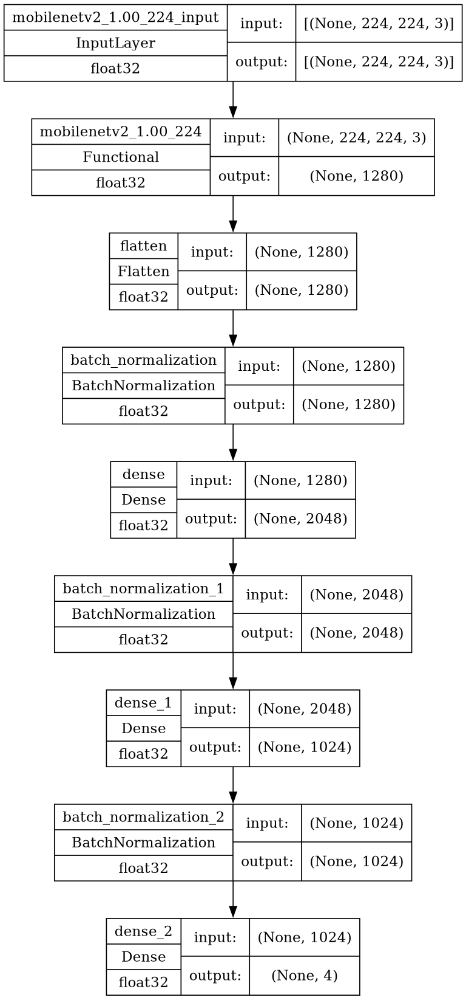

In [9]:
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [10]:
checkpoint_cb =ModelCheckpoint("model_MobileNetV2.h5", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=10, restore_best_weights=True)
model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy'])
hist = model.fit(train_generator, epochs=50, validation_data=val_generator, callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/50


I0000 00:00:1707329414.404425      75 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


850/850 [==============================] - ETA: 0s - loss: 0.7943 - accuracy: 0.6905

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


850/850 [==============================] - 231s 261ms/step - loss: 0.7943 - accuracy: 0.6905 - val_loss: 0.5611 - val_accuracy: 0.7749
Epoch 2/50
850/850 [==============================] - 93s 109ms/step - loss: 0.4840 - accuracy: 0.8049 - val_loss: 0.4064 - val_accuracy: 0.8361
Epoch 3/50
850/850 [==============================] - 92s 108ms/step - loss: 0.3889 - accuracy: 0.8453 - val_loss: 0.3336 - val_accuracy: 0.8749
Epoch 4/50
850/850 [==============================] - 92s 108ms/step - loss: 0.3047 - accuracy: 0.8812 - val_loss: 0.2857 - val_accuracy: 0.8908
Epoch 5/50
850/850 [==============================] - 98s 116ms/step - loss: 0.2598 - accuracy: 0.8985 - val_loss: 0.2663 - val_accuracy: 0.9017
Epoch 6/50
850/850 [==============================] - 97s 114ms/step - loss: 0.2276 - accuracy: 0.9149 - val_loss: 0.2472 - val_accuracy: 0.9035
Epoch 7/50
850/850 [==============================] - 96s 113ms/step - loss: 0.1896 - accuracy: 0.9291 - val_loss: 0.2545 - val_accuracy: 0.

<a id="11"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px"> Evaluate The Model  </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [11]:
hist_=pd.DataFrame(hist.history)
hist_

,loss,accuracy,val_loss,val_accuracy
0,0.794263,0.690477,0.561089,0.774868
1,0.484034,0.804907,0.406399,0.836080
2,0.388852,0.845257,0.333598,0.874926
3,0.304652,0.881193,0.285740,0.890818
4,0.259773,0.898518,0.266288,0.901707
5,0.227642,0.914886,0.247242,0.903473
6,0.189606,0.929084,0.254533,0.907298
7,0.166628,0.937948,0.252487,0.911418
8,0.154564,0.942583,0.229285,0.919070
9,0.138296,0.948174,0.197686,0.933785


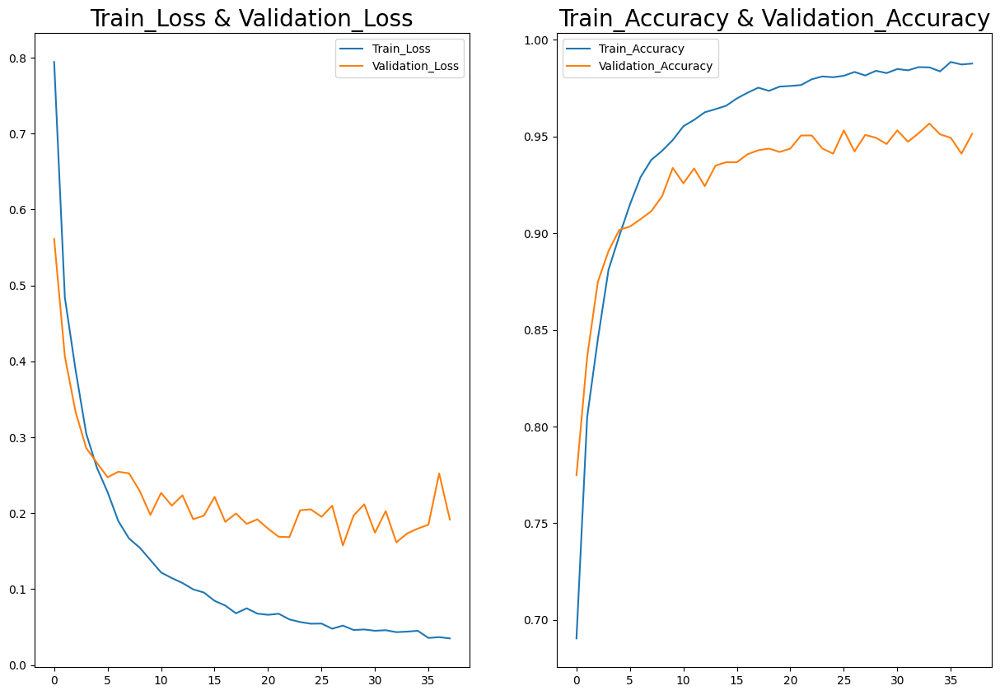

In [12]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.show()

In [13]:
score, acc= model.evaluate(test_generator)
print('Test Loss =', score)
print('Test Accuracy =', acc)

107/107 [==============================] - 28s 264ms/step - loss: 0.1583 - accuracy: 0.9482
Test Loss = 0.15833717584609985
Test Accuracy = 0.9482200741767883


In [14]:
y_test =test_generator.classes
predictions = model.predict(test_generator)
y_pred = np.argmax(predictions,axis=1)
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
df

107/107 [==============================] - 11s 94ms/step


,Actual,Prediction
0,2,2
1,0,0
2,1,1
3,0,0
4,1,1
...,...,...
3394,2,2
3395,1,1
3396,2,2
3397,2,2


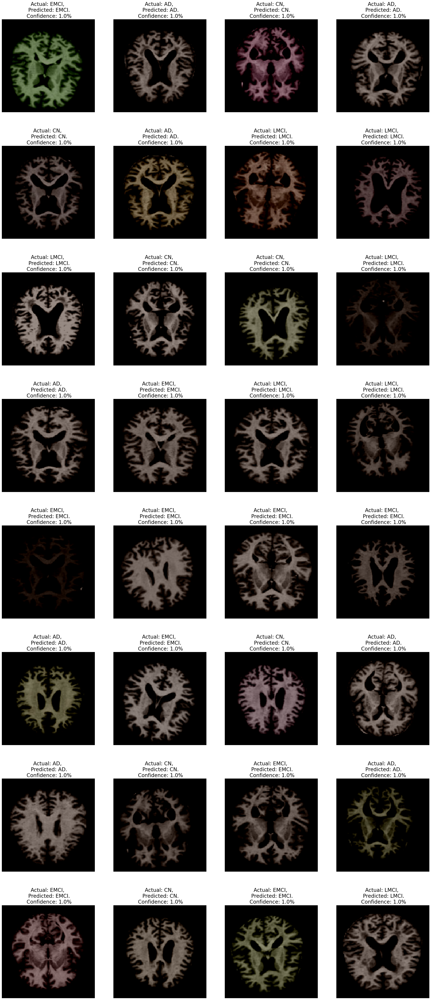

In [15]:
plt.figure(figsize=(30,70))
batch = next(test_generator)
images= batch[0]
for n in range(32):
    plt.subplot(8,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    plt.title(f"Actual: {class_num[y_test[n]]}, \n Predicted: {class_num[y_pred[n]]}.\n Confidence: {round(predictions[n][np.argmax(predictions[n])],0)}%",fontsize=20)

array([[862,   0,  12,  22],
       [  1, 645,   0,   1],
       [ 12,   0, 904,  44],
       [ 25,   1,  54, 816]])

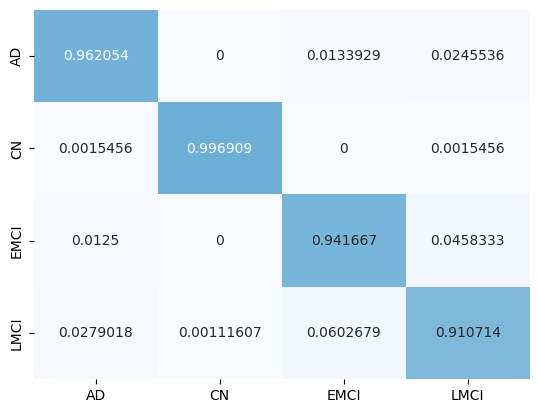

In [16]:
CM = confusion_matrix(y_test,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues',
            xticklabels=class_num, yticklabels=class_num)
CM

In [17]:
ClassificationReport = classification_report(y_test,y_pred,target_names=class_num)
print('Classification Report is : ', ClassificationReport)

Classification Report is :                precision    recall  f1-score   support

          AD       0.96      0.96      0.96       896
          CN       1.00      1.00      1.00       647
        EMCI       0.93      0.94      0.94       960
        LMCI       0.92      0.91      0.92       896

    accuracy                           0.95      3399
   macro avg       0.95      0.95      0.95      3399
weighted avg       0.95      0.95      0.95      3399

